#### Team:
##### M Manonmana Udupa - PES2UG20CS181 Sec C
##### Lohit Siriki - PES2UG20CS180 Sec C
##### Khushi Satish - PES2UG20CS162 Sec C
##### Hemachandran S - PES2UG20CS139 Sec C

### Project Details
### Topic - Information spread and Influence Determination in social networks and complete network analysis

Our project focusses on a a complete analysis of the famous Game of Thrones(GOT) series whose story is spanned across 5 books.
The aim is to detect communities,predict links,observe information spread in the network,identify important individuals and compare different centrality measures.

### Versions of the required libraries
1) numpy - 1.22.3
2) pandas - 1.5.3
3) seaborn - 0.12.2
4) matplotlib - 3.6.3
5) plotly - 5.14.1
5) dash -  2.9.3
6) sklearn - 0.0.post1
7) networkx - 2.8.8

### Instructions:
#### 1)Run the cells in the given order
#### 2)One of the cells with "budget=2" takes about 25-30 min to execute due to the large no. of nodes(about 4000)


In [1]:
!pip show networkx

Name: networkx
Version: 2.8.8
Summary: Python package for creating and manipulating graphs and networks
Home-page: https://networkx.org/
Author: Aric Hagberg
Author-email: hagberg@lanl.gov
License: 
Location: c:\users\manu0\appdata\roaming\python\python310\site-packages
Requires: 
Required-by: node2vec, nxviz, python-louvain, scikit-image, torch


#### I. Install the required libraries

In [2]:
! pip install plotly
! pip install networkx
! pip install dash


[notice] A new release of pip is available: 23.0 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.0 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 23.0 -> 23.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


#### II. Load the required libraries

In [3]:
import pandas as pd
import plotly.graph_objects as go
import networkx as nx
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

import seaborn as sns

from itertools import product

plt.rcParams["figure.figsize"] = (20,10)
import tqdm as tqdm

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

C:\Users\manu0\AppData\Local\Temp\ipykernel_32628\3944772841.py:15: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


### EDA and Visualization (Book 1)

In [4]:
df=pd.read_csv("book1.csv")
df

,Source,Target,Type,Weight,book,Id
0,Addam-Marbrand,Jaime-Lannister,Undirected,3,1,Addam-Marbrand
1,Addam-Marbrand,Tywin-Lannister,Undirected,6,1,Addam-Marbrand
2,Aegon-I-Targaryen,Daenerys-Targaryen,Undirected,5,1,Aegon-I-Targaryen
3,Aegon-I-Targaryen,Eddard-Stark,Undirected,4,1,Aegon-I-Targaryen
4,Aemon-Targaryen-(Maester-Aemon),Alliser-Thorne,Undirected,4,1,Aemon-Targaryen-(Maester-Aemon)
...,...,...,...,...,...,...
679,Tyrion-Lannister,Willis-Wode,Undirected,4,1,Tyrion-Lannister
680,Tyrion-Lannister,Yoren,Undirected,10,1,Tyrion-Lannister
681,Tywin-Lannister,Varys,Undirected,4,1,Tywin-Lannister
682,Tywin-Lannister,Walder-Frey,Undirected,8,1,Tywin-Lannister


In [5]:
# number of row and data type
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 684 entries, 0 to 683
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Source  684 non-null    object
 1   Target  684 non-null    object
 2   Type    684 non-null    object
 3   Weight  684 non-null    int64 
 4   book    684 non-null    int64 
 5   Id      684 non-null    object
dtypes: int64(2), object(4)
memory usage: 32.2+ KB


In [6]:
# check null data
df.isnull().sum()

Source    0
Target    0
Type      0
Weight    0
book      0
Id        0
dtype: int64

In [7]:
# drop rows with null values
df = df.dropna()
df.isnull().sum()

Source    0
Target    0
Type      0
Weight    0
book      0
Id        0
dtype: int64

In [8]:
# give prefix 'Book' before the book column
df.book = df.book.apply(int)
df.book = 'Book ' + df.book.map(str)

df.head()

,Source,Target,Type,Weight,book,Id
0,Addam-Marbrand,Jaime-Lannister,Undirected,3,Book 1,Addam-Marbrand
1,Addam-Marbrand,Tywin-Lannister,Undirected,6,Book 1,Addam-Marbrand
2,Aegon-I-Targaryen,Daenerys-Targaryen,Undirected,5,Book 1,Aegon-I-Targaryen
3,Aegon-I-Targaryen,Eddard-Stark,Undirected,4,Book 1,Aegon-I-Targaryen
4,Aemon-Targaryen-(Maester-Aemon),Alliser-Thorne,Undirected,4,Book 1,Aemon-Targaryen-(Maester-Aemon)


In [9]:
df.describe()

,Weight
count,684.000000
mean,10.769006
std,17.294432
min,3.000000
25%,4.000000
50%,5.000000
75%,11.000000
max,291.000000


10 Characters with Most Appearence as Source and Target

C:\Users\manu0\AppData\Local\Temp\ipykernel_32628\4192922942.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df1 = df.groupby(['Source']).sum()
C:\Users\manu0\AppData\Local\Temp\ipykernel_32628\4192922942.py:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df2 = df.groupby(['Target']).sum()


<AxesSubplot: xlabel='Weight', ylabel='Target'>

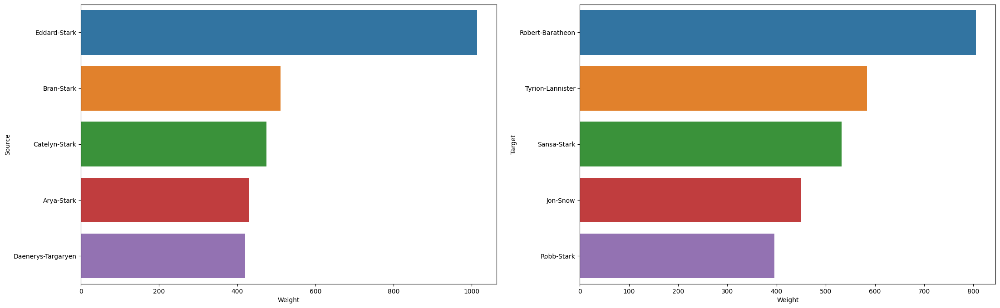

In [10]:
df1 = df.groupby(['Source']).sum()
df1.reset_index(inplace=True)
df1 = df1.sort_values(by=['Weight'], ascending=False)

df2 = df.groupby(['Target']).sum()
df2.reset_index(inplace=True)
df2 = df2.sort_values(by=['Weight'], ascending=False)

fig, axes = plt.subplots(1,2, figsize=(26,8),sharex=False, sharey=False)

sns.barplot(y='Source', x='Weight', data=df1.head(5),
             orient='h', ax=axes[0])

sns.barplot(y='Target',x='Weight', data=df2.head(5),
            orient='h', ax=axes[1])

10 Characters with Most Appearence Either Source or Target

C:\Users\manu0\AppData\Local\Temp\ipykernel_32628\3352371780.py:14: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df3['Weight'], kde=False, ax=axes[1])


<AxesSubplot: xlabel='Weight'>

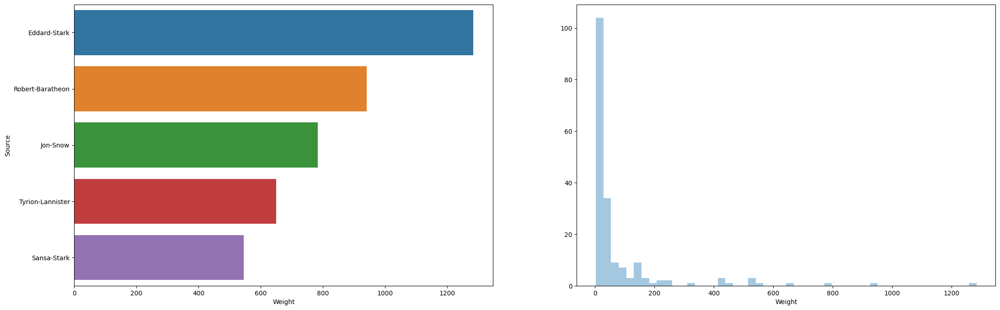

In [11]:
df2['Source'] = df2['Target']
combine = [df1[['Source','Weight']],df2[['Source','Weight']]]

df3 = pd.concat(combine)
df3 = df3.groupby(['Source']).sum()
df3.reset_index(inplace=True)
df3 = df3.sort_values(by=['Weight'], ascending=False)

fig, axes = plt.subplots(1,2, figsize=(26,8),sharex=False, sharey=False)

sns.barplot(y='Source', x='Weight', data=df3.head(5),
              orient='h', ax=axes[0])

sns.distplot(df3['Weight'], kde=False, ax=axes[1])

#### III. Load the Dataset

In [12]:
books = []
for i in range(5):
    books.append(pd.read_csv('book{}-edges.csv'.format(i+1)))

In [13]:
books

[                              Source              Target        Type  weight  \
 0                     Addam-Marbrand     Jaime-Lannister  Undirected       3   
 1                     Addam-Marbrand     Tywin-Lannister  Undirected       6   
 2                  Aegon-I-Targaryen  Daenerys-Targaryen  Undirected       5   
 3                  Aegon-I-Targaryen        Eddard-Stark  Undirected       4   
 4    Aemon-Targaryen-(Maester-Aemon)      Alliser-Thorne  Undirected       4   
 ..                               ...                 ...         ...     ...   
 679                 Tyrion-Lannister         Willis-Wode  Undirected       4   
 680                 Tyrion-Lannister               Yoren  Undirected      10   
 681                  Tywin-Lannister               Varys  Undirected       4   
 682                  Tywin-Lannister         Walder-Frey  Undirected       8   
 683                     Waymar-Royce     Will-(prologue)  Undirected      18   
 
      book  
 0       1  


In [14]:
all_books = pd.concat(books)
all_books.head()

,Source,Target,Type,weight,book
0,Addam-Marbrand,Jaime-Lannister,Undirected,3,1.0
1,Addam-Marbrand,Tywin-Lannister,Undirected,6,1.0
2,Aegon-I-Targaryen,Daenerys-Targaryen,Undirected,5,1.0
3,Aegon-I-Targaryen,Eddard-Stark,Undirected,4,1.0
4,Aemon-Targaryen-(Maester-Aemon),Alliser-Thorne,Undirected,4,1.0


In [15]:
edges = all_books.groupby(['Source','Target']).agg({'weight':'sum'}).reset_index()

In [16]:
edges.sort_values('weight',ascending=False).head()

,Source,Target,weight
1334,Eddard-Stark,Robert-Baratheon,334
2031,Jon-Snow,Samwell-Tarly,228
1965,Joffrey-Baratheon,Sansa-Stark,222
1972,Joffrey-Baratheon,Tyrion-Lannister,219
640,Bran-Stark,Hodor,209


#### IV. Construct the Graph

In [17]:
GOT = nx.from_pandas_edgelist(edges, 
                            source='Source',
                            target='Target',
                            edge_attr='weight' )

In [18]:
weighted_degrees = dict(nx.degree(GOT,weight='weight'))
max_degree = max(weighted_degrees.values())

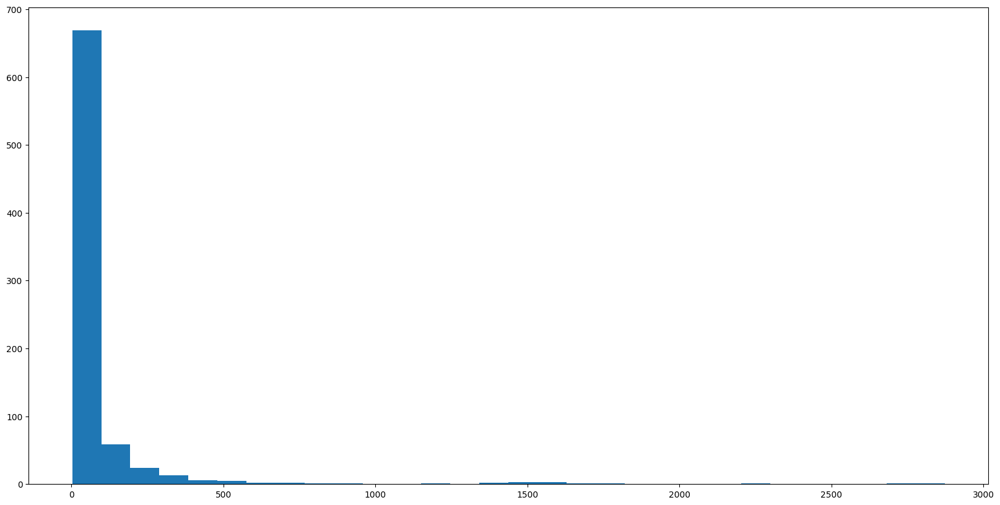

In [19]:
h = plt.hist(weighted_degrees.values(), bins = 30)

Let's focus on the subnetwork of the key characters:

In [20]:
subG = GOT.subgraph([n for n in weighted_degrees if weighted_degrees[n]>200])

In [21]:
print(nx.info(subG))

Graph with 63 nodes and 496 edges


C:\Users\manu0\AppData\Local\Temp\ipykernel_32628\3727974504.py:1: DeprecationWarning: info is deprecated and will be removed in version 3.0.

  print(nx.info(subG))


In [22]:
pos = nx.spring_layout(subG,weight='weight',iterations=20, k = 4)

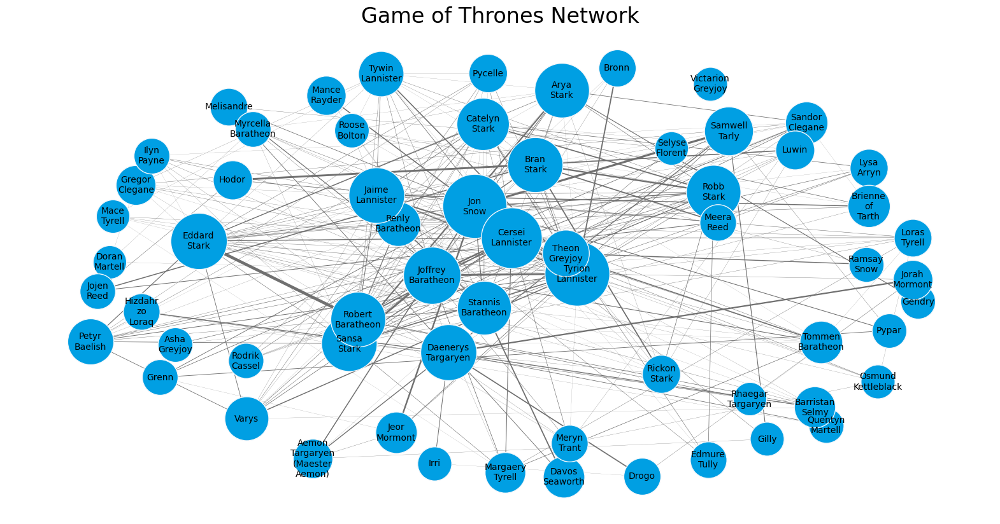

In [23]:
plt.axis('off')
plt.title('Game of Thrones Network',fontsize = 24)


for node in subG.nodes():
    size = 100*weighted_degrees[node]**0.5
    ns = nx.draw_networkx_nodes(subG,pos,nodelist=[node], node_size=size, node_color='#009fe3')
    ns.set_edgecolor('#f2f6fa')

nx.draw_networkx_labels(subG,pos,{n:n.replace('-','\n') for n in subG.nodes() if weighted_degrees[n]>100},font_size=10);

for e in subG.edges(data=True):
    if e[2]['weight']>10:
        nx.draw_networkx_edges(subG,pos,[e],width=e[2]['weight']/100,edge_color='#707070')

#### V. Observing Information Spread in the Graph

In [24]:
infection_times = {}

In [25]:
def independent_cascade(G,t,infection_times):
    #doing a t->t+1 step of independent_cascade simulation
    #each infectious node infects neigbors with probabilty proportional to the weight
    max_weight = max([e[2]['weight'] for e in G.edges(data=True)])
    current_infectious = [n for n in infection_times if infection_times[n]==t]
    for n in current_infectious:
        for v in G.neighbors(n):
            if v not in infection_times:
                if  G.get_edge_data(n,v)['weight'] >= np.random.random()*max_weight:
                    infection_times[v] = t+1
    return infection_times

In [26]:
def plot_G(G,pos,infection_times,t):
    current_infectious = [n for n in infection_times if infection_times[n]==t]
    plt.figure()
    plt.axis('off')
    plt.title('Game of Thrones Network, t={}'.format(t),fontsize = 24)

    for node in G.nodes():
        size = 100*weighted_degrees[node]**0.5
        if node in current_infectious:
            ns = nx.draw_networkx_nodes(G,pos,nodelist=[node], node_size=size, node_color='#feba02')
        elif infection_times.get(node,9999999)<t:
            ns = nx.draw_networkx_nodes(G,pos,nodelist=[node], node_size=size, node_color='#ff0000')
        else:
            ns = nx.draw_networkx_nodes(G,pos,nodelist=[node], node_size=size, node_color='#009fe3')
        ns.set_edgecolor('#f2f6fa')
    nx.draw_networkx_labels(G,pos,{n:n.replace('-','\n') for n in G.nodes() if weighted_degrees[n]>100},font_size=10);

    for e in G.edges(data=True):
        if e[2]['weight']>10:
            nx.draw_networkx_edges(G,pos,[e],width=e[2]['weight']/100,edge_color='#707070')

Suppose Bran and Sam told Jon a secret. So let's see who will find out about it?

In [27]:
infection_times = {'Bran-Stark':-1,'Samwell-Tarly':-1,'Jon-Snow':0}

->In the below figures, the items in Red are infected so it means they know the secret

->And they all are in sequence as the secret passes through the characters

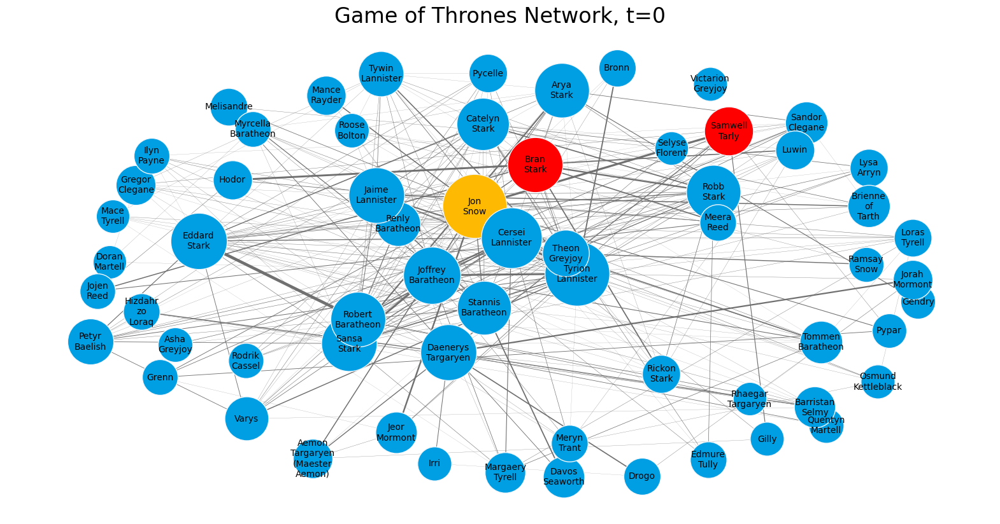

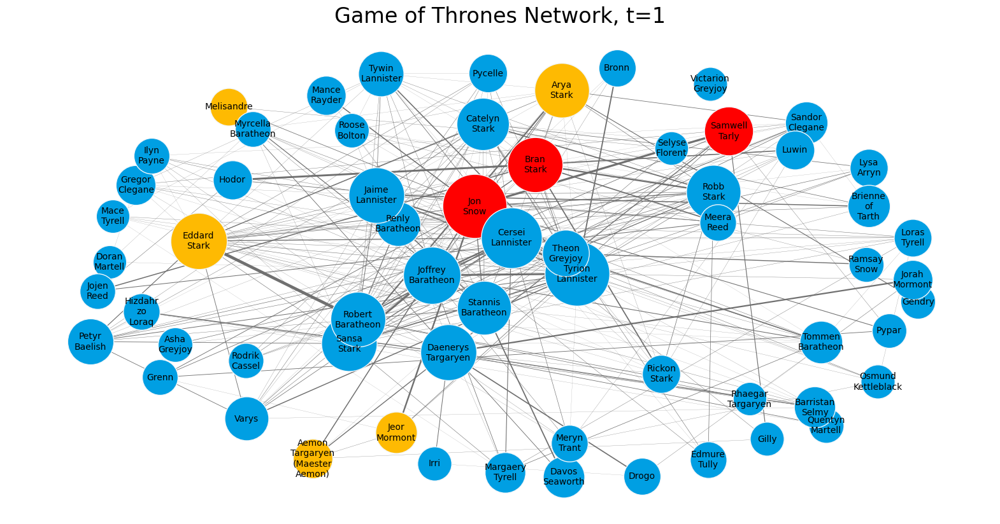

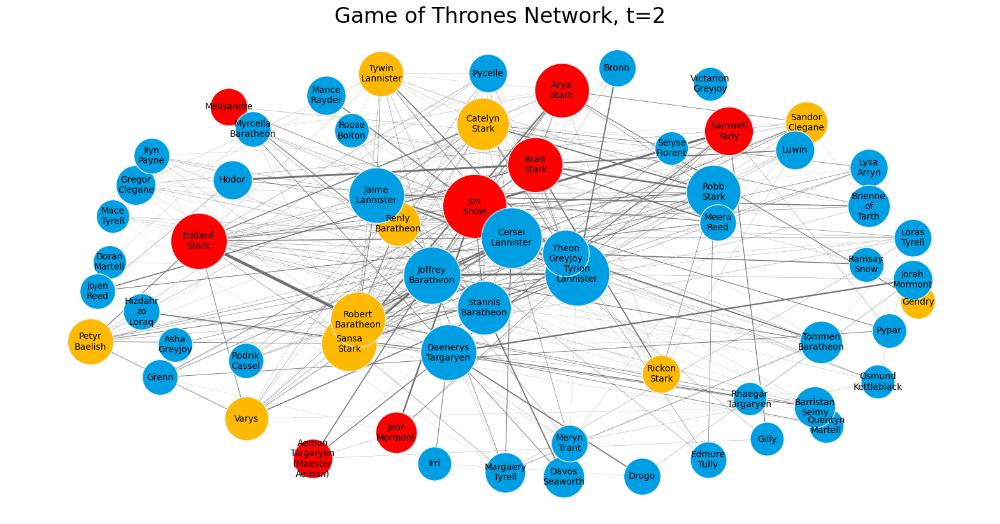

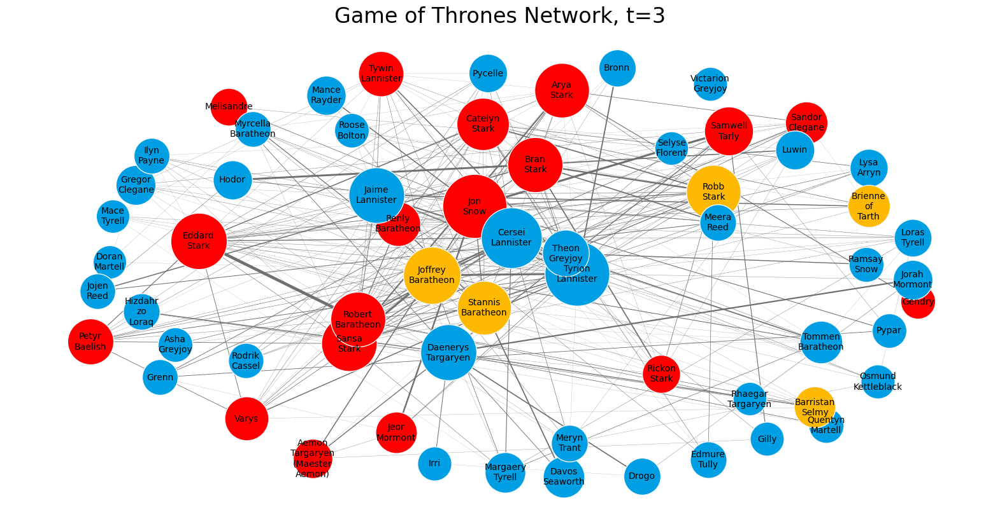

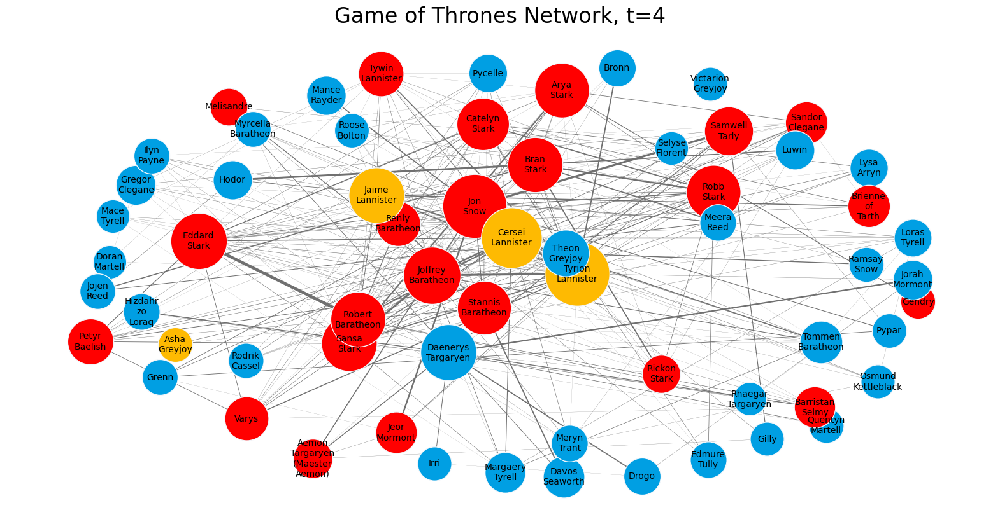

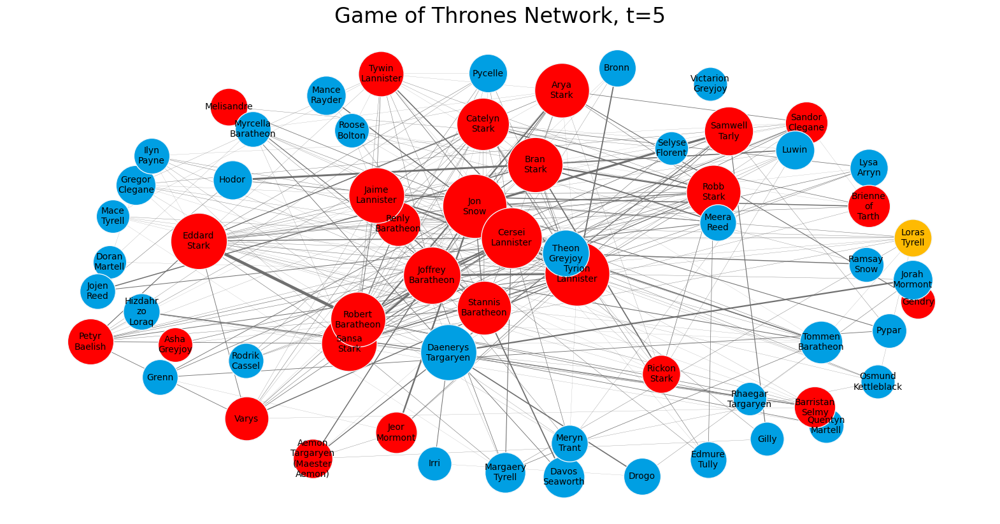

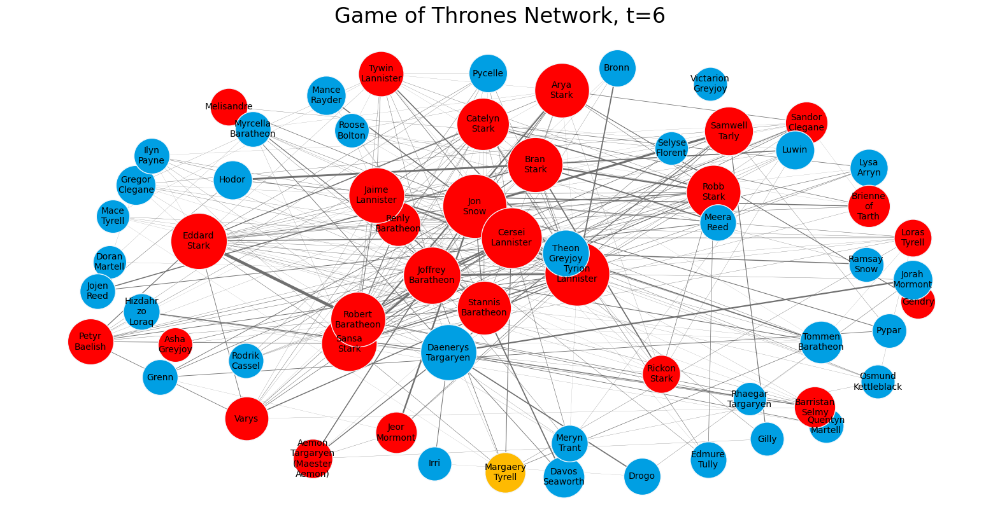

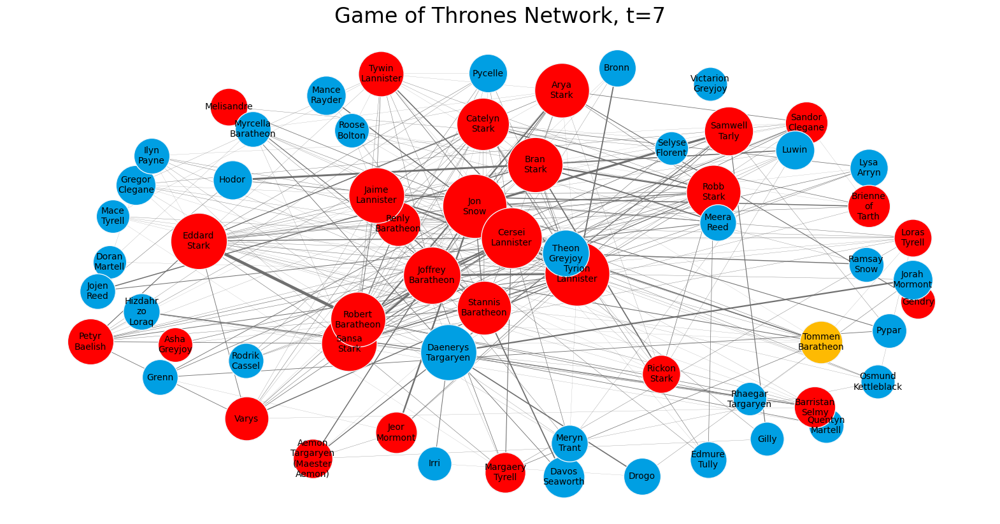

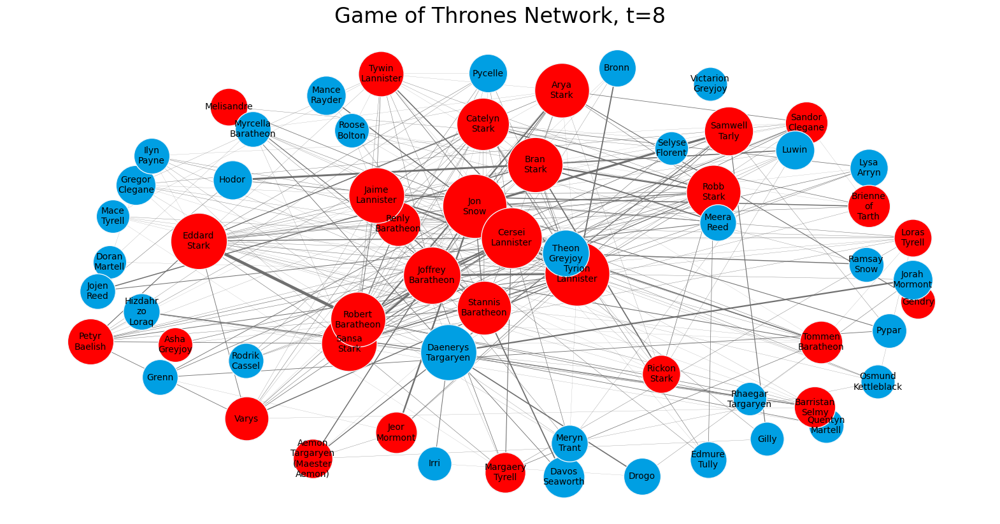

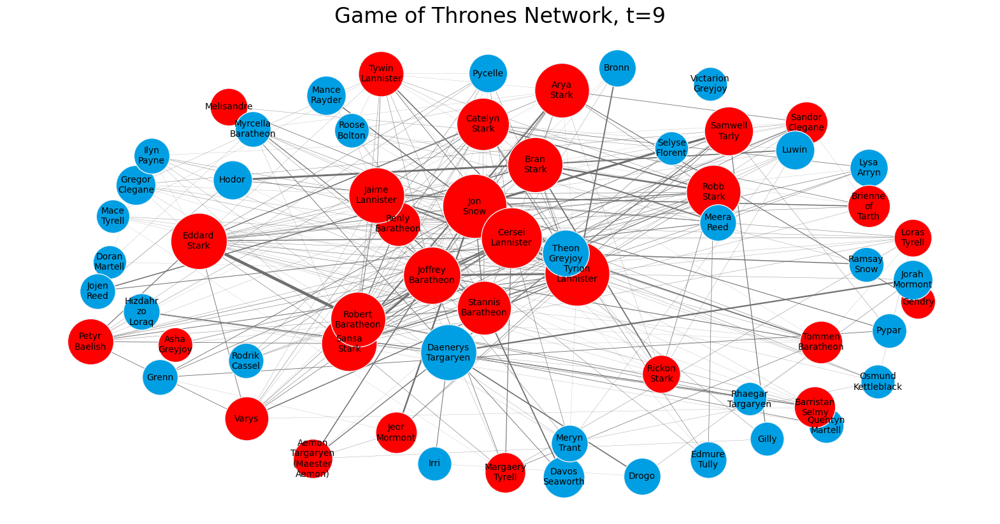

In [28]:
for t in range(10):
    plot_G(subG,pos,infection_times,t)
    infection_times = independent_cascade(subG,t,infection_times)

#### VI. Influence Identification and Maximization

In [29]:
top = pd.DataFrame.from_dict(dict(nx.degree(subG)),orient='index').sort_values(0,ascending=False)
top.columns = ['Degree']
top['Weighted Degree'] =  pd.DataFrame.from_dict(dict(nx.degree(subG,weight='weight')),orient='index')
top['PageRank'] = pd.DataFrame.from_dict(dict(nx.pagerank_numpy(subG,weight='weight')),orient='index')
top['Betweenness'] =  pd.DataFrame.from_dict(dict(nx.betweenness_centrality(subG,weight='weight')),orient='index')

C:\Users\manu0\AppData\Local\Temp\ipykernel_32628\836299726.py:4: DeprecationWarning: networkx.pagerank_numpy is deprecated and will be removed in NetworkX 3.0, use networkx.pagerank instead.
  top['PageRank'] = pd.DataFrame.from_dict(dict(nx.pagerank_numpy(subG,weight='weight')),orient='index')
C:\Users\manu0\AppData\Roaming\Python\Python310\site-packages\networkx\algorithms\link_analysis\pagerank_alg.py:354: FutureWarning: google_matrix will return an np.ndarray instead of a np.matrix in
NetworkX version 3.0.
  M = google_matrix(


In [30]:
top.head()

,Degree,Weighted Degree,PageRank,Betweenness
Tyrion-Lannister,40,1842,0.052710,0.036445
Robert-Baratheon,37,1271,0.037012,0.223912
Joffrey-Baratheon,35,1518,0.042829,0.033051
Eddard-Stark,34,1330,0.037789,0.024061
Cersei-Lannister,34,1627,0.046179,0.004671


In [31]:
methods = top.columns

print(nx.info(subG))
print(nx.info(GOT))

Graph with 63 nodes and 496 edges
Graph with 796 nodes and 2823 edges


C:\Users\manu0\AppData\Local\Temp\ipykernel_32628\1451010056.py:3: DeprecationWarning: info is deprecated and will be removed in version 3.0.

  print(nx.info(subG))
C:\Users\manu0\AppData\Local\Temp\ipykernel_32628\1451010056.py:4: DeprecationWarning: info is deprecated and will be removed in version 3.0.

  print(nx.info(GOT))


For different budgets lets compare the centrality metrics for seeding

In [32]:
max_budget = len(subG.nodes())
trials = 50
all_results = []
for budget in tqdm.tqdm_notebook(range(max_budget)):
    results = {'budget':budget}
    for method in methods:
        infections = []
        for i in range(trials):
            infected = 0
            t= 0
            infection_times = {n:0 for n in top.sort_values(method,ascending=False).index[:budget]}
            while len(infection_times)>infected:
                #t+=1
                infected = len(infection_times)
                infection_times = independent_cascade(subG,t,infection_times)
                t+=1
            infections.append(infected)
        results[method] = np.round(np.mean(infections)/len(subG.nodes()),2)

    all_results.append(results)

C:\Users\manu0\AppData\Local\Temp\ipykernel_32628\57981247.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for budget in tqdm.tqdm_notebook(range(max_budget)):


  0%|          | 0/63 [00:00<?, ?it/s]

In [33]:
res_df = pd.concat([pd.DataFrame.from_dict(r,orient='index').T 
                        for r in all_results]).set_index('budget')

In [34]:
res_df.index = res_df.index/len(subG.nodes())

In [35]:
res_df.head()

,Degree,Weighted Degree,PageRank,Betweenness
budget,,,,
0.000000,0.00,0.00,0.00,0.00
0.015873,0.49,0.48,0.52,0.52
0.031746,0.50,0.51,0.50,0.52
0.047619,0.50,0.50,0.52,0.53
0.063492,0.52,0.52,0.54,0.54


#### VII. Analysis

Text(0.5, 0, 'Seeding Budget (out of graph size)')

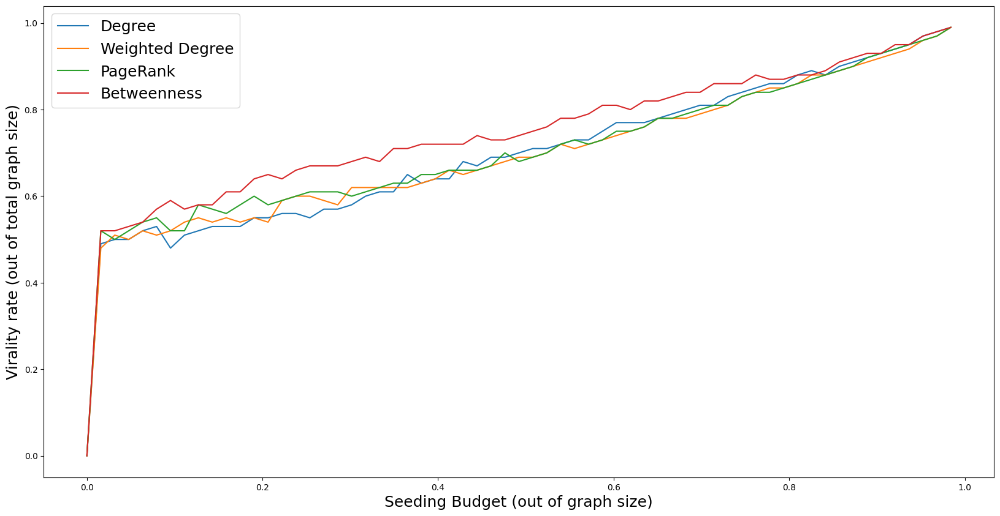

In [36]:
res_df.plot()
plt.legend(fontsize = 18)
plt.ylabel('Virality rate (out of total graph size)',fontsize = 18)
plt.xlabel('Seeding Budget (out of graph size)', fontsize = 18)

Let's find the best couple by bruteforce search

In [37]:
budget=2

seed_sets = list(product(*[subG.nodes()]*budget))

print(len(seed_sets),'Seeding options')

3969 Seeding options


In [38]:
#Try reducing no. of trials to reduce time consumption
budget = 2
trials = 20
all_results = []
results = {'budget':budget}
for seed in tqdm.tqdm_notebook(seed_sets[:]):
    infections = []
    for i in range(trials):
        infected = 0
        t= 0
        infection_times = {n:0 for n in seed}
        while len(infection_times)>infected:
            #t+=1
            infected = len(infection_times)
            infection_times = independent_cascade(subG,t,infection_times)
            t+=1
        infections.append(infected)
    results[seed] = np.round(np.mean(infections)/len(subG.nodes()),2)

all_results.append(results)

C:\Users\manu0\AppData\Local\Temp\ipykernel_32628\1193144791.py:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for seed in tqdm.tqdm_notebook(seed_sets[:]):


  0%|          | 0/3969 [00:00<?, ?it/s]

In [39]:
sorted(results.items(), key = lambda x: x[1], reverse=True)[:10]

[('budget', 2),
 (('Rodrik-Cassel', 'Robert-Baratheon'), 0.58),
 (('Joffrey-Baratheon', 'Daenerys-Targaryen'), 0.58),
 (('Joffrey-Baratheon', 'Meera-Reed'), 0.58),
 (('Barristan-Selmy', 'Robb-Stark'), 0.58),
 (('Irri', 'Robb-Stark'), 0.57),
 (('Rickon-Stark', 'Arya-Stark'), 0.57),
 (('Davos-Seaworth', 'Jon-Snow'), 0.57),
 (('Robb-Stark', 'Aemon-Targaryen-(Maester-Aemon)'), 0.57),
 (('Jon-Snow', 'Catelyn-Stark'), 0.57)]

#### VIII.Different Centrality Measures

In [40]:
from operator import itemgetter

In [41]:
Graph_GOT=subG

Degree Centrality

In [42]:
degc = nx.degree_centrality(Graph_GOT)
# let's list the scores
dclist = sorted(degc.items(), key=itemgetter(1), reverse=True)
dclist

[('Tyrion-Lannister', 0.6451612903225806),
 ('Robert-Baratheon', 0.5967741935483871),
 ('Joffrey-Baratheon', 0.564516129032258),
 ('Cersei-Lannister', 0.5483870967741935),
 ('Eddard-Stark', 0.5483870967741935),
 ('Jaime-Lannister', 0.532258064516129),
 ('Sansa-Stark', 0.5161290322580645),
 ('Stannis-Baratheon', 0.5161290322580645),
 ('Robb-Stark', 0.46774193548387094),
 ('Catelyn-Stark', 0.43548387096774194),
 ('Arya-Stark', 0.43548387096774194),
 ('Tywin-Lannister', 0.4193548387096774),
 ('Jon-Snow', 0.4032258064516129),
 ('Petyr-Baelish', 0.3870967741935484),
 ('Renly-Baratheon', 0.3709677419354839),
 ('Bran-Stark', 0.3709677419354839),
 ('Varys', 0.3225806451612903),
 ('Tommen-Baratheon', 0.3225806451612903),
 ('Loras-Tyrell', 0.3225806451612903),
 ('Sandor-Clegane', 0.3064516129032258),
 ('Gregor-Clegane', 0.29032258064516125),
 ('Rodrik-Cassel', 0.29032258064516125),
 ('Brienne-of-Tarth', 0.29032258064516125),
 ('Theon-Greyjoy', 0.29032258064516125),
 ('Barristan-Selmy', 0.2903225

Betweenness Centrality

In [43]:
bet = nx.betweenness_centrality(Graph_GOT)
# let's list the scores
bclist = sorted(bet.items(), key=itemgetter(1), reverse=True)
bclist

[('Robert-Baratheon', 0.10785477519735544),
 ('Tyrion-Lannister', 0.08275097597015822),
 ('Jon-Snow', 0.07480684680535754),
 ('Stannis-Baratheon', 0.06363898303621304),
 ('Eddard-Stark', 0.05853582033277769),
 ('Joffrey-Baratheon', 0.05302872462305408),
 ('Daenerys-Targaryen', 0.05066426839627968),
 ('Bran-Stark', 0.044640695088662405),
 ('Barristan-Selmy', 0.04052236486461626),
 ('Robb-Stark', 0.038139912427715965),
 ('Cersei-Lannister', 0.035211704937082776),
 ('Theon-Greyjoy', 0.027419195862468354),
 ('Arya-Stark', 0.027211467438786194),
 ('Jaime-Lannister', 0.026536252842229966),
 ('Sansa-Stark', 0.02460745392935743),
 ('Samwell-Tarly', 0.01616107966157572),
 ('Catelyn-Stark', 0.014950603719881222),
 ('Rickon-Stark', 0.01334302384585028),
 ('Tywin-Lannister', 0.013342425995564946),
 ('Jorah-Mormont', 0.012408114201902147),
 ('Renly-Baratheon', 0.011728025650022593),
 ('Luwin', 0.01155773226808455),
 ('Mance-Rayder', 0.011314567150035777),
 ('Jeor-Mormont', 0.011313657827864821),
 (

Closeness Centrality

In [44]:
clos = nx.closeness_centrality(Graph_GOT)
# let's list the scores
cclist = sorted(clos.items(), key=itemgetter(1), reverse=True)
cclist

[('Tyrion-Lannister', 0.7380952380952381),
 ('Robert-Baratheon', 0.7126436781609196),
 ('Cersei-Lannister', 0.6888888888888889),
 ('Eddard-Stark', 0.6888888888888889),
 ('Joffrey-Baratheon', 0.6813186813186813),
 ('Sansa-Stark', 0.6595744680851063),
 ('Jaime-Lannister', 0.6595744680851063),
 ('Stannis-Baratheon', 0.6526315789473685),
 ('Robb-Stark', 0.6326530612244898),
 ('Catelyn-Stark', 0.62),
 ('Arya-Stark', 0.62),
 ('Jon-Snow', 0.6078431372549019),
 ('Bran-Stark', 0.5961538461538461),
 ('Renly-Baratheon', 0.5904761904761905),
 ('Petyr-Baelish', 0.5904761904761905),
 ('Tywin-Lannister', 0.5904761904761905),
 ('Varys', 0.5688073394495413),
 ('Rodrik-Cassel', 0.5636363636363636),
 ('Theon-Greyjoy', 0.5636363636363636),
 ('Tommen-Baratheon', 0.5585585585585585),
 ('Loras-Tyrell', 0.5486725663716814),
 ('Barristan-Selmy', 0.5486725663716814),
 ('Gregor-Clegane', 0.543859649122807),
 ('Rickon-Stark', 0.543859649122807),
 ('Sandor-Clegane', 0.543859649122807),
 ('Brienne-of-Tarth', 0.5391

PageRank Centrality

In [45]:
s='\n sorted pagerank:\n'
print (s)
pgr=nx.pagerank(Graph_GOT)
print(sorted(pgr.items(), key=itemgetter(1), reverse=True))


 sorted pagerank:

[('Tyrion-Lannister', 0.05270690060523002), ('Jon-Snow', 0.04772708907380106), ('Cersei-Lannister', 0.04617508158001354), ('Joffrey-Baratheon', 0.042825120876514924), ('Bran-Stark', 0.03951368340264188), ('Eddard-Stark', 0.03778752747152163), ('Robert-Baratheon', 0.03701259287602412), ('Daenerys-Targaryen', 0.03429569522436973), ('Sansa-Stark', 0.03416635016608144), ('Stannis-Baratheon', 0.031946591686199136), ('Robb-Stark', 0.03161172900400166), ('Jaime-Lannister', 0.030700537656929094), ('Catelyn-Stark', 0.025799670331423788), ('Arya-Stark', 0.023643348167967655), ('Samwell-Tarly', 0.02238660881944443), ('Theon-Greyjoy', 0.018864806617273633), ('Renly-Baratheon', 0.017690275972625714), ('Petyr-Baelish', 0.016926677748989524), ('Tywin-Lannister', 0.016616605081981428), ('Varys', 0.016053177275522454), ('Tommen-Baratheon', 0.01452637442251008), ('Barristan-Selmy', 0.013839866225468154), ('Jorah-Mormont', 0.012696828397286761), ('Sandor-Clegane', 0.012631981743965319

EigenValue Centrality

In [46]:
# Compute the eigenvalue centrality of nodes
eig_centrality = nx.eigenvector_centrality(Graph_GOT)

# Print the eigenvalue centrality of each node
for node, centrality in eig_centrality.items():
    print(f"Node {node}: {centrality:.3f}")

Node Irri: 0.006
Node Grenn: 0.012
Node Gregor-Clegane: 0.142
Node Renly-Baratheon: 0.175
Node Bronn: 0.083
Node Rickon-Stark: 0.087
Node Hodor: 0.030
Node Davos-Seaworth: 0.049
Node Robb-Stark: 0.194
Node Doran-Martell: 0.062
Node Rhaegar-Targaryen: 0.070
Node Pypar: 0.013
Node Asha-Greyjoy: 0.025
Node Margaery-Tyrell: 0.108
Node Varys: 0.155
Node Mance-Rayder: 0.050
Node Mace-Tyrell: 0.105
Node Selyse-Florent: 0.030
Node Jon-Snow: 0.145
Node Melisandre: 0.050
Node Pycelle: 0.134
Node Sansa-Stark: 0.225
Node Cersei-Lannister: 0.231
Node Lysa-Arryn: 0.107
Node Petyr-Baelish: 0.187
Node Bran-Stark: 0.145
Node Sandor-Clegane: 0.145
Node Osmund-Kettleblack: 0.081
Node Tommen-Baratheon: 0.143
Node Hizdahr-zo-Loraq: 0.009
Node Aemon-Targaryen-(Maester-Aemon): 0.034
Node Gilly: 0.016
Node Robert-Baratheon: 0.227
Node Catelyn-Stark: 0.196
Node Roose-Bolton: 0.103
Node Rodrik-Cassel: 0.121
Node Loras-Tyrell: 0.156
Node Victarion-Greyjoy: 0.009
Node Daenerys-Targaryen: 0.069
Node Brienne-of-Tar

Katz Centrality

In [47]:
# Compute the PageRank centrality of nodes
pr_centrality = nx.pagerank(Graph_GOT, max_iter=2000)

# Print the PageRank centrality of each node
for node, centrality in pr_centrality.items():
    print(f"Node {node}: {centrality:.3f}")

Node Irri: 0.006
Node Grenn: 0.009
Node Gregor-Clegane: 0.009
Node Renly-Baratheon: 0.018
Node Bronn: 0.008
Node Rickon-Stark: 0.011
Node Hodor: 0.012
Node Davos-Seaworth: 0.009
Node Robb-Stark: 0.032
Node Doran-Martell: 0.004
Node Rhaegar-Targaryen: 0.006
Node Pypar: 0.008
Node Asha-Greyjoy: 0.006
Node Margaery-Tyrell: 0.011
Node Varys: 0.016
Node Mance-Rayder: 0.008
Node Mace-Tyrell: 0.006
Node Selyse-Florent: 0.006
Node Jon-Snow: 0.048
Node Melisandre: 0.011
Node Pycelle: 0.010
Node Sansa-Stark: 0.034
Node Cersei-Lannister: 0.046
Node Lysa-Arryn: 0.008
Node Petyr-Baelish: 0.017
Node Bran-Stark: 0.040
Node Sandor-Clegane: 0.013
Node Osmund-Kettleblack: 0.007
Node Tommen-Baratheon: 0.015
Node Hizdahr-zo-Loraq: 0.009
Node Aemon-Targaryen-(Maester-Aemon): 0.011
Node Gilly: 0.007
Node Robert-Baratheon: 0.037
Node Catelyn-Stark: 0.026
Node Roose-Bolton: 0.007
Node Rodrik-Cassel: 0.008
Node Loras-Tyrell: 0.010
Node Victarion-Greyjoy: 0.003
Node Daenerys-Targaryen: 0.034
Node Brienne-of-Tar

#### IX. Community Detection

In [48]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.preprocessing import normalize
from sklearn.cluster import KMeans
import random
import matplotlib.patches as mpatches
from itertools import count

from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [49]:

edgeDF = pd.read_csv('https://raw.githubusercontent.com/batchusaisuraj/GOT_season-3/main/got-s3-edges.csv')
nodeDF = pd.read_csv('https://raw.githubusercontent.com/batchusaisuraj/GOT_season-3/main/got-s3-nodes.csv')

In [50]:
thrones = nx.from_pandas_edgelist(edgeDF, 'Source', 'Target',['Weight'])

In [51]:
thrones1 = nx.Graph()
degeDF = edgeDF.reset_index()
for index, row in edgeDF.iterrows():
  thrones1.add_edge(row.Source, row.Target, weight = row.Weight)

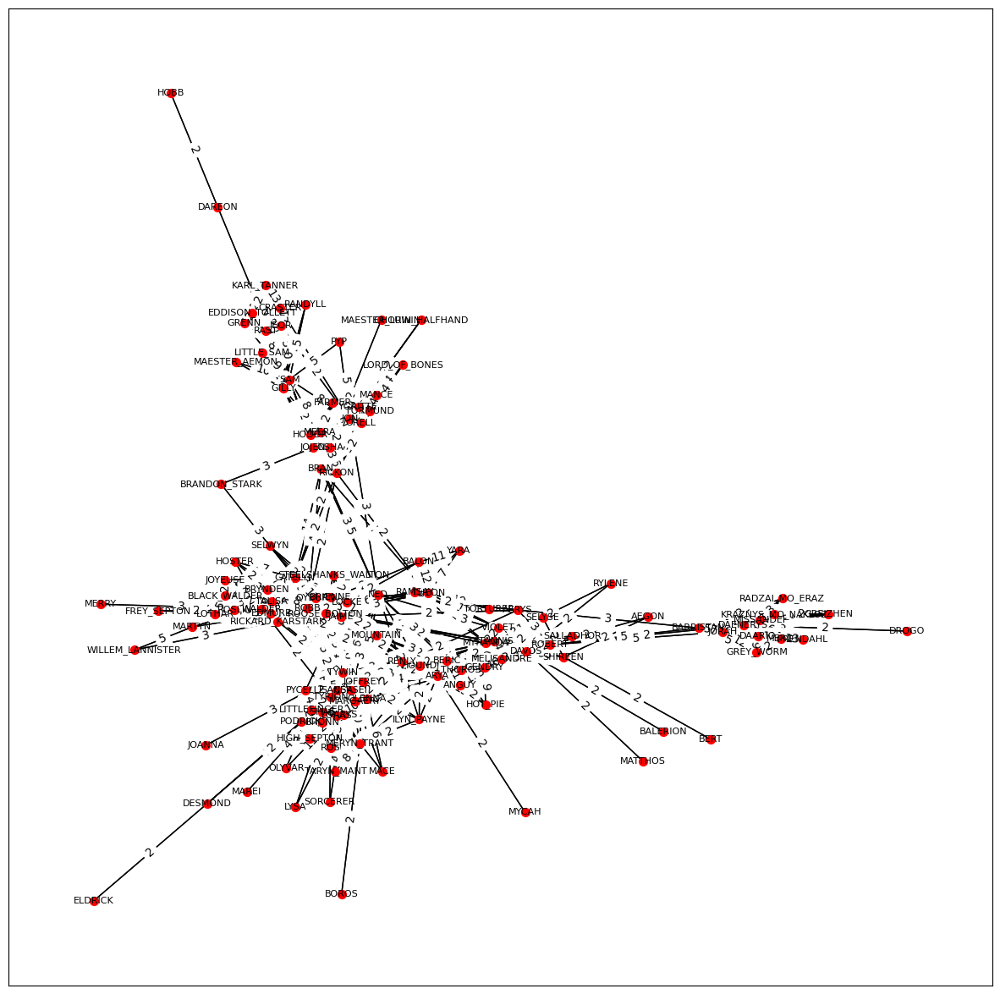

In [52]:
plt.figure(3, figsize = (15, 15))
pos = nx.fruchterman_reingold_layout(thrones1)

nx.draw_networkx(thrones1, pos = pos, node_size = 50, font_size = 8, node_color = "red")
nx.draw_networkx_edges(thrones1, pos = pos)
edge_labels = nx.get_edge_attributes(thrones1, 'weight')
nx.draw_networkx_edge_labels(thrones1, pos = pos, edge_labels = edge_labels)
plt.show()

In [53]:
n = thrones.number_of_nodes()
m = thrones.number_of_edges()
print("Number of nodes =",str(n))
print("Number of edges =", str(m))
print("Number of connected components =", str(nx.number_connected_components(thrones)))

Number of nodes = 124
Number of edges = 504
Number of connected components = 1


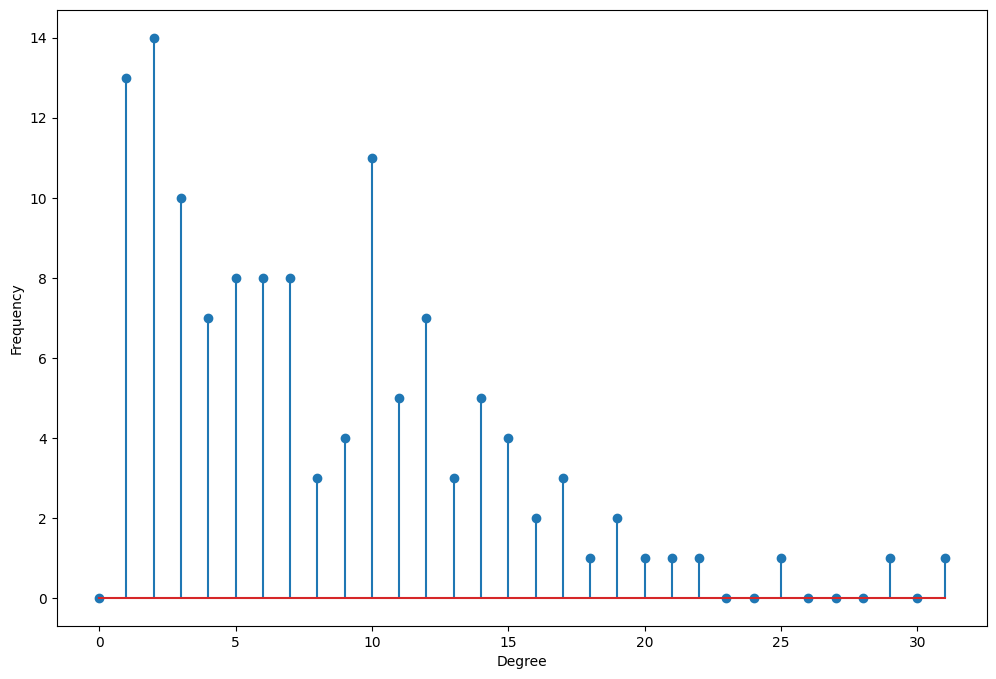

In [54]:
deg_freq = np.array(nx.degree_histogram(thrones)).astype('float')
plt.figure(figsize = (12, 8))
plt.stem(deg_freq)
plt.ylabel("Frequency")
plt.xlabel("Degree")
plt.show()

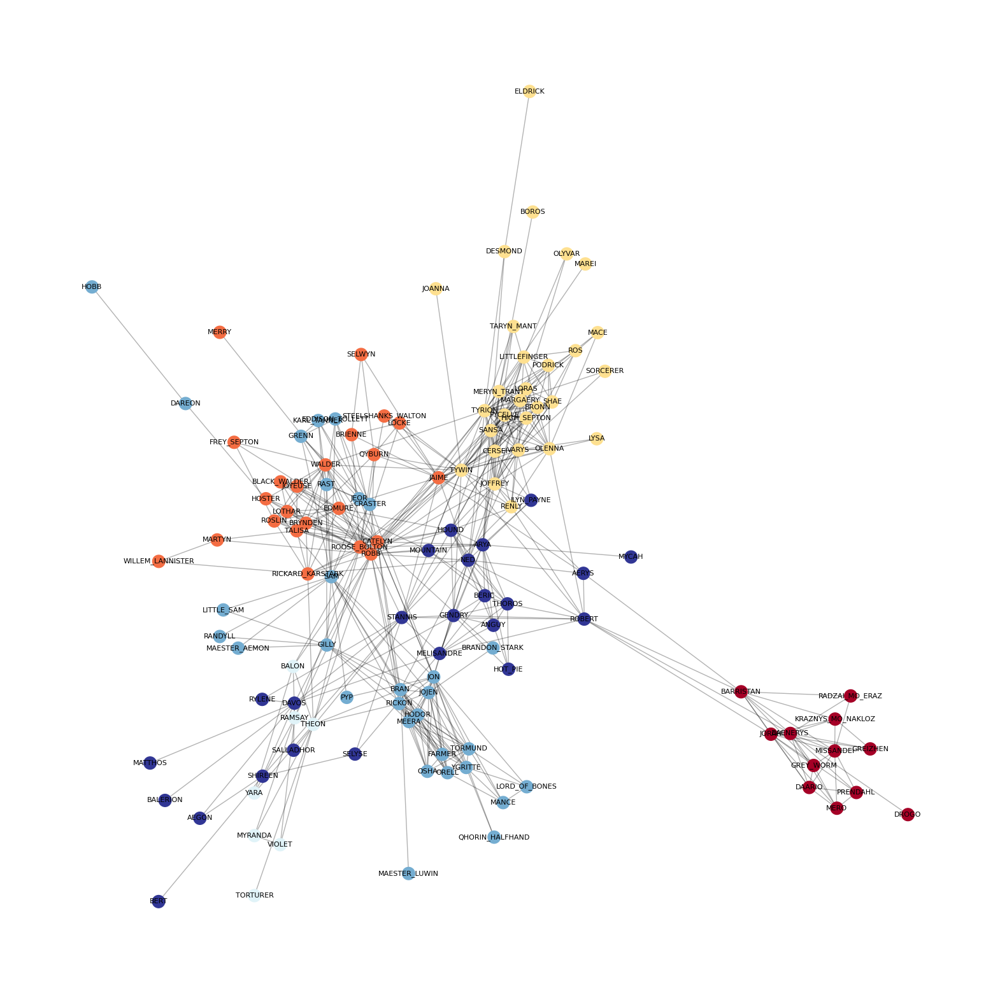

The communities detected are:
[('DAENERYS', 0), ('JORAH', 0), ('MISSANDEI', 0), ('BARRISTAN', 0), ('KRAZNYS_MO_NAKLOZ', 0), ('DAARIO', 0), ('RADZAI_MO_ERAZ', 0), ('MERO', 0), ('PRENDAHL', 0), ('GREY_WORM', 0), ('GREIZHEN', 0), ('DROGO', 0), ('BRIENNE', 1), ('JAIME', 1), ('ROBB', 1), ('TALISA', 1), ('LOCKE', 1), ('CATELYN', 1), ('QYBURN', 1), ('EDMURE', 1), ('RICKARD_KARSTARK', 1), ('ROOSE_BOLTON', 1), ('WALDER', 1), ('BRYNDEN', 1), ('STEELSHANKS_WALTON', 1), ('ROSLIN', 1), ('MARTYN', 1), ('BLACK_WALDER', 1), ('HOSTER', 1), ('LOTHAR', 1), ('JOYEUSE', 1), ('WILLEM_LANNISTER', 1), ('FREY_SEPTON', 1), ('SELWYN', 1), ('MERRY', 1), ('TYRION', 2), ('TYWIN', 2), ('CERSEI', 2), ('SANSA', 2), ('SHAE', 2), ('BRONN', 2), ('JOFFREY', 2), ('MARGAERY', 2), ('OLENNA', 2), ('VARYS', 2), ('LITTLEFINGER', 2), ('PODRICK', 2), ('LORAS', 2), ('ROS', 2), ('OLYVAR', 2), ('MERYN_TRANT', 2), ('PYCELLE', 2), ('TARYN_MANT', 2), ('RENLY', 2), ('MACE', 2), ('MAREI', 2), ('SORCERER', 2), ('HIGH_SEPTON', 2), ('JOANNA

In [55]:
import community.community_louvain as community_louvain
partition = community_louvain.best_partition(thrones)
pos = nx.spring_layout(thrones)
plt.figure(figsize=(20, 20))
plt.axis('off')
nx.draw_networkx_nodes(thrones, pos, node_size = 200, cmap = plt.cm.RdYlBu, node_color=list(partition.values()))
nx.draw_networkx_labels(thrones, pos, font_size = 8)
nx.draw_networkx_edges(thrones, pos, alpha = 0.3)
plt.show(thrones)

print("The communities detected are:")
print(sorted(partition.items(), key = lambda item:item[1]))

SPECTRAL CLUSTERING

In [56]:
# Class to perform spectral clustering for k clusters, given k

class SpectralClustering:
    
    def __init__(self, Graph):
        # Initialize the graph, nodes and the normalized Laplacian

        self.graph = Graph
        self.normalized_laplacian = nx.linalg.normalized_laplacian_matrix(Graph).toarray()
        self.nodes = Graph.nodes()

    def compute_eigenspace(self):
        # Compute the eigenvalues and the eigenvectors using Numpy and sort them in ascending order 

        eigenvalues, eigenvectors = np.linalg.eig(self.normalized_laplacian)

        sort_index = np.argsort(eigenvalues) # Returns the list of indices that would sort the array
        sorted_eigenvectors = eigenvectors[:, sort_index]

        return sorted_eigenvectors

    def fit(self, k):
        eigenvectors = self.compute_eigenspace()
        k_eigenvectors = np.array(eigenvectors)[:,:k]
        dataset = pd.DataFrame(k_eigenvectors, index=self.nodes)

        # print(dataset)

        k_means_clusters = KMeans(n_clusters = k, random_state=42)
        self.clusters = k_means_clusters.fit(k_eigenvectors)
        
    def predict_labels(self):
        # Returns the labels 
        return self.clusters.labels_

    def assign_labels(self, labels):
        # Helper to assign the labels as node attributes
        for i,node in enumerate(self.graph.nodes()):
            self.graph.nodes[node]['label'] = labels[i]

    def plot_graph(self, n_clusters, title='Graph after Spectral Clustering'):
        # Plots the graph 

        labels = self.clusters.labels_
        self.assign_labels(labels)

        colour_list = ['blue','green','red','yellow','cyan', 'magenta','lightblue','grey']
        sampled_colours = dict(zip(set(labels),random.sample(colour_list, n_clusters)))

        legend_handles = []
        for label, color in sampled_colours.items():
            colour_handle = mpatches.Patch(color=color, label=label)
            legend_handles.append(colour_handle)

        colours = [sampled_colours[i] for i in labels]

        pos_fr = nx.fruchterman_reingold_layout(self.graph)
        plt.figure(figsize=(20,20))
        plt.title(title)
        plt.legend(handles=legend_handles)
        nx.draw(self.graph, pos=pos_fr, node_size=500, node_color=colours, with_labels=True)
        plt.show()

<class 'networkx.utils.decorators.argmap'> compilation 28:4: FutureWarning: normalized_laplacian_matrix will return a scipy.sparse array instead of a matrix in Networkx 3.0.
c:\Python310\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


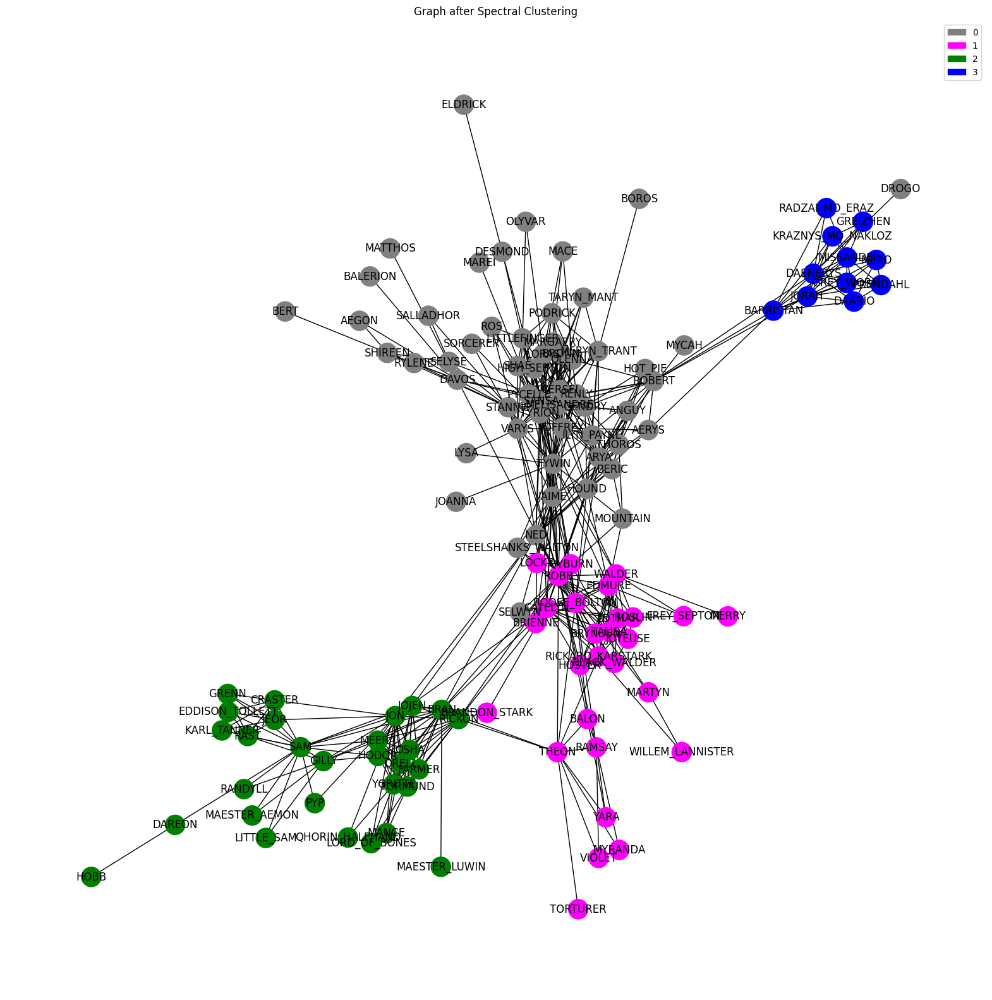

In [57]:
# Performing Spectral Clustering on the graph
k = 4
SpecClust = SpectralClustering(thrones)
SpecClust.fit(k)
clustering_labels = SpecClust.predict_labels()
# print(labels)

for i,node in enumerate(thrones.nodes()):
    thrones.nodes[node]['label'] = clustering_labels[i]

colour_map = ['']*len(clustering_labels)
for i, label in enumerate(clustering_labels):
    if label == 0:
        colour_map[i] = 'lightgreen'
    else:
        colour_map[i] = "red"

# nx.draw(CG, with_labels=True, node_color=colour_map)
SpecClust.plot_graph(k, title="Graph after Spectral Clustering")

Clustering Coefficient

In [58]:
print(nx.transitivity(thrones))

0.4810656836461126


In [59]:
local_clustering = (nx.clustering(thrones))
local_clustering

{'JON': 0.3742690058479532,
 'YGRITTE': 0.6666666666666666,
 'BRIENNE': 0.6,
 'JAIME': 0.3014705882352941,
 'TYRION': 0.33666666666666667,
 'TYWIN': 0.28078817733990147,
 'RAMSAY': 0.5238095238095238,
 'THEON': 0.2909090909090909,
 'CERSEI': 0.4473684210526316,
 'GILLY': 0.3888888888888889,
 'SAM': 0.2647058823529412,
 'ROBB': 0.22795698924731184,
 'TALISA': 0.6212121212121212,
 'SANSA': 0.5029239766081871,
 'ARYA': 0.30833333333333335,
 'HOUND': 0.38461538461538464,
 'DAVOS': 0.17777777777777778,
 'STANNIS': 0.27472527472527475,
 'SHAE': 0.6666666666666666,
 'BRONN': 0.6813186813186813,
 'DAENERYS': 0.42424242424242425,
 'JORAH': 0.5777777777777777,
 'BRAN': 0.45588235294117646,
 'OSHA': 1.0,
 'MISSANDEI': 0.5777777777777777,
 'JOJEN': 0.6043956043956044,
 'JOFFREY': 0.4380952380952381,
 'MARGAERY': 0.7878787878787878,
 'THOROS': 0.5111111111111111,
 'LOCKE': 0.7333333333333333,
 'BARRISTAN': 0.5,
 'CATELYN': 0.30303030303030304,
 'KRAZNYS_MO_NAKLOZ': 0.9,
 'QYBURN': 0.571428571428571

#### IX. Link Prediction

In [60]:
import numpy as np
import random
import networkx as nx
from IPython.display import Image
import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

In [61]:
n = thrones.number_of_nodes()
m = thrones.number_of_edges()
print("Number of nodes =", str(n))
print("Number of edges =", str(m))
print("Number of connected components =", str(nx.number_connected_components(thrones)))

Number of nodes = 124
Number of edges = 504
Number of connected components = 1


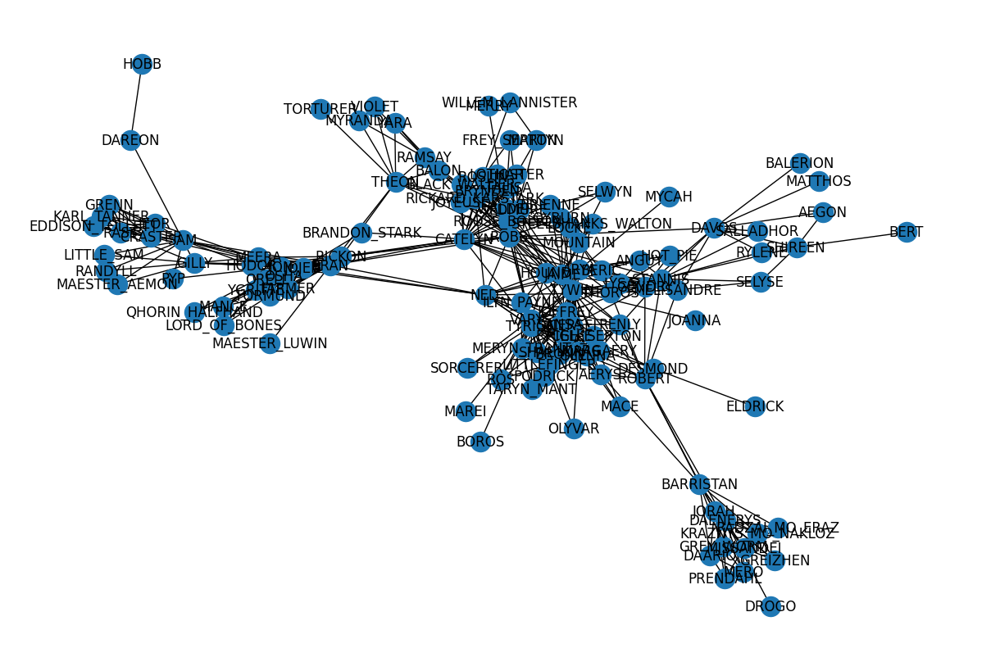

In [62]:
plt.figure(figsize=(12, 8))
nx.draw(thrones, with_labels = True)

In [63]:
# take a random sample of edges

proportion_edges = 0.25
edge_subset = random.sample(thrones.edges(), int(proportion_edges * thrones.number_of_edges()))

# remove some edges. the goal is to try and repredict these edges, and measure how close the prediction is to the original.

G_train = thrones.copy()
G_train.remove_edges_from(edge_subset)

C:\Users\manu0\AppData\Local\Temp\ipykernel_32628\2653875242.py:4: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  edge_subset = random.sample(thrones.edges(), int(proportion_edges * thrones.number_of_edges()))


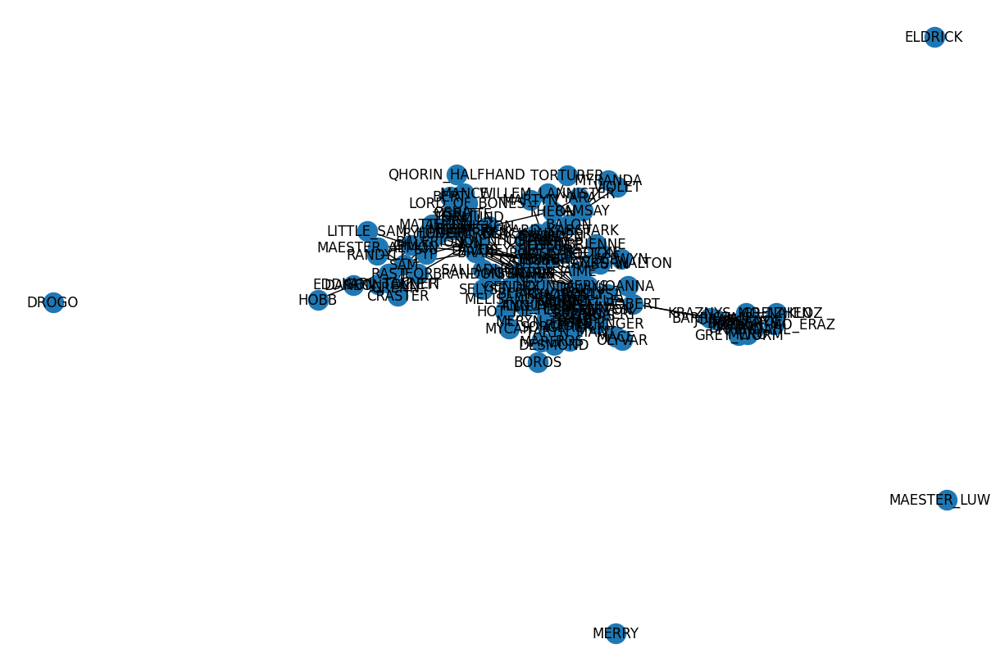

In [64]:
plt.figure(figsize=(12, 8))
nx.draw(G_train, with_labels = True)

In [65]:
edge_subset_size = len(list(edge_subset))
print("Deleted edges =", str(edge_subset_size))
print("Remaining edges =", str(m - edge_subset_size))

# just printing the edge_subset.
print(edge_subset)

Deleted edges = 126
Remaining edges = 378
[('VARYS', 'PYCELLE'), ('BRAN', 'OSHA'), ('JORAH', 'GREY_WORM'), ('CERSEI', 'LITTLEFINGER'), ('JAIME', 'CERSEI'), ('TYRION', 'PYCELLE'), ('BLACK_WALDER', 'JOYEUSE'), ('CATELYN', 'BLACK_WALDER'), ('BRAN', 'TORMUND'), ('SANSA', 'DESMOND'), ('DAENERYS', 'DAARIO'), ('DESMOND', 'ELDRICK'), ('THOROS', 'MOUNTAIN'), ('MYRANDA', 'VIOLET'), ('STANNIS', 'ROBERT'), ('OSHA', 'JOJEN'), ('JOFFREY', 'VARYS'), ('OLENNA', 'MACE'), ('EDMURE', 'BRYNDEN'), ('BRAN', 'HODOR'), ('RAMSAY', 'ROOSE_BOLTON'), ('BRONN', 'MARGAERY'), ('TYWIN', 'ROOSE_BOLTON'), ('MELISANDRE', 'ROBERT'), ('SANSA', 'HIGH_SEPTON'), ('OSHA', 'FARMER'), ('LITTLEFINGER', 'PYCELLE'), ('WALDER', 'HOSTER'), ('SANSA', 'PYCELLE'), ('ROBB', 'RICKARD_KARSTARK'), ('GILLY', 'JOJEN'), ('JOJEN', 'FARMER'), ('THOROS', 'MELISANDRE'), ('TYWIN', 'GENDRY'), ('YGRITTE', 'ORELL'), ('VARYS', 'LITTLEFINGER'), ('SAM', 'JOJEN'), ('BRONN', 'MERYN_TRANT'), ('EDMURE', 'LOTHAR'), ('SHIREEN', 'SELYSE'), ('THEON', 'BRAN'), (

PROXIMITY BASED APPROACH

i) Jaccard Coefficient

In [66]:
# calculating jaccard coefficient for all the node pairs in G_train.

prediction_jaccard = list(nx.jaccard_coefficient(G_train))
score_jaccard, label_jaccard = zip(*[(s, (u,v) in edge_subset) for (u,v,s) in prediction_jaccard])

In [67]:
# binary classification here. taking various thresholds for the jaccard coefficient.
# calculating fpr, tpr, and auc values for various thresholds of the jaccard coefficient.

fpr_jaccard, tpr_jaccard, thresholds_jaccard = roc_curve(label_jaccard, score_jaccard)
auc_jaccard = roc_auc_score(label_jaccard, score_jaccard)  

In [68]:
auc_jaccard

0.9201899259313092

ii)Adamic-Adar similarrity

In [69]:
prediction_adamic = list(nx.adamic_adar_index(G_train))
score_adamic, label_adamic = zip(*[(s, (u,v) in edge_subset) for (u,v,s) in prediction_adamic])

In [70]:
fpr_adamic, tpr_adamic, thresholds_adamic = roc_curve(label_adamic, score_adamic)
auc_adamic = roc_auc_score(label_adamic, score_adamic)

In [71]:
auc_adamic

0.9301505397183009

iii)Preferential Attachment

In [72]:
prediction_pref = list(nx.preferential_attachment(G_train))
score_pref, label_pref = zip(*[(s, (u,v) in edge_subset) for (u,v,s) in prediction_pref])

In [73]:
fpr_pref, tpr_pref, thresholds_pref = roc_curve(label_pref, score_pref)
auc_pref = roc_auc_score(label_pref, score_pref)

In [74]:
auc_pref

0.7680382193636431

iv)ROC Curve

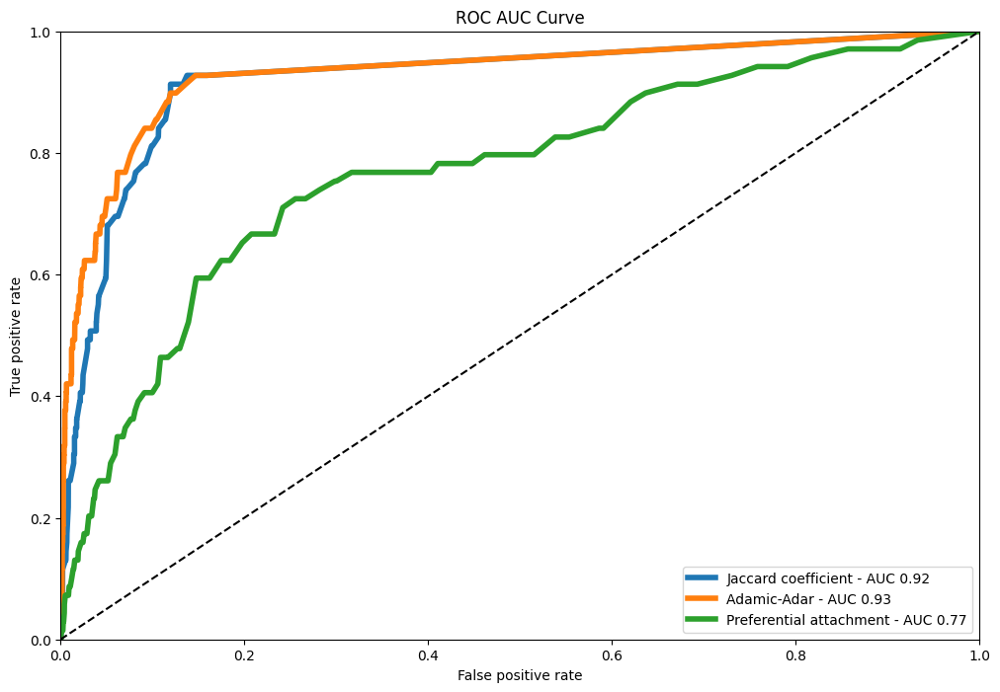

In [75]:

plt.figure(figsize=(12, 8))
plt.plot(fpr_jaccard, tpr_jaccard, label='Jaccard coefficient - AUC %.2f' % auc_jaccard, linewidth=4)
plt.plot(fpr_adamic, tpr_adamic, label='Adamic-Adar - AUC %.2f' % auc_adamic, linewidth=4)
plt.plot(fpr_pref, tpr_pref, label='Preferential attachment - AUC %.2f' % auc_pref, linewidth=4)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title("ROC AUC Curve")
plt.legend(loc='lower right')
plt.show()
     

Best Performance

In [76]:
# the best performance coefficient might vary in some cases.
# however, in this particular case, it is clear from the auc, that the Adamic-Adar test performs the best.

optimal_idx = np.argmax(tpr_adamic - fpr_adamic)
optimal_threshold = thresholds_adamic[optimal_idx]
print("Optimal threshold =", optimal_threshold)

# this is the threshold value above which a link will be classified as existant, and below which a link will be classified as non-existant.
     

Optimal threshold = 0.3284587387530511


#### X. Detailed Analysis and Answering Questions related to the Story

In [77]:
book1 = pd.read_csv("book1.csv")

In [78]:
book1

,Source,Target,Type,Weight,book,Id
0,Addam-Marbrand,Jaime-Lannister,Undirected,3,1,Addam-Marbrand
1,Addam-Marbrand,Tywin-Lannister,Undirected,6,1,Addam-Marbrand
2,Aegon-I-Targaryen,Daenerys-Targaryen,Undirected,5,1,Aegon-I-Targaryen
3,Aegon-I-Targaryen,Eddard-Stark,Undirected,4,1,Aegon-I-Targaryen
4,Aemon-Targaryen-(Maester-Aemon),Alliser-Thorne,Undirected,4,1,Aemon-Targaryen-(Maester-Aemon)
...,...,...,...,...,...,...
679,Tyrion-Lannister,Willis-Wode,Undirected,4,1,Tyrion-Lannister
680,Tyrion-Lannister,Yoren,Undirected,10,1,Tyrion-Lannister
681,Tywin-Lannister,Varys,Undirected,4,1,Tywin-Lannister
682,Tywin-Lannister,Walder-Frey,Undirected,8,1,Tywin-Lannister


In [79]:
book1Graph = nx.Graph()

In [80]:
for _, edge in book1.iterrows():
    book1Graph.add_edge(edge['Source'], edge['Target'], weight=edge['Weight'])

In [81]:
allBooks = [book1Graph]

bookNames = ['book2.csv', 'book3.csv', 'book4.csv', 'book5.csv']
for bookName in bookNames:
    book = pd.read_csv(bookName)
    GBook = nx.Graph()
    for _, edge in book.iterrows():
        GBook.add_edge(edge['Source'], edge['Target'], weight=edge['weight'])
    allBooks.append(GBook)

##### 1)Measuring the importance of a node in a network by looking at the number of neighbors it has, that is, the number of nodes it is connected to with the help of degree of centrality

In [82]:
degOfCentrality = []
# degOfCentrailtySorted = []
# i = 0

for book in allBooks:
    degocen = nx.degree_centrality(book)
    degOfCentrality.append(degocen)

In [83]:
i = 1
for degOfOneBook in degOfCentrality:
    degOfOneBookSorted =  sorted(degOfOneBook.items(), key=lambda x:x[1], reverse=True)[0:10]
    print("Book: {}".format(i))
    i+=1
    print(degOfOneBookSorted)
    print("\n")

Book: 1
[('Eddard-Stark', 0.3548387096774194), ('Robert-Baratheon', 0.2688172043010753), ('Tyrion-Lannister', 0.24731182795698928), ('Catelyn-Stark', 0.23118279569892475), ('Jon-Snow', 0.19892473118279572), ('Robb-Stark', 0.18817204301075272), ('Sansa-Stark', 0.18817204301075272), ('Bran-Stark', 0.17204301075268819), ('Cersei-Lannister', 0.16129032258064518), ('Joffrey-Baratheon', 0.16129032258064518)]


Book: 2
[('Tyrion-Lannister', 0.2054263565891473), ('Joffrey-Baratheon', 0.1821705426356589), ('Cersei-Lannister', 0.16666666666666666), ('Arya-Stark', 0.15503875968992248), ('Stannis-Baratheon', 0.1434108527131783), ('Robb-Stark', 0.13565891472868216), ('Catelyn-Stark', 0.12790697674418605), ('Theon-Greyjoy', 0.12403100775193798), ('Renly-Baratheon', 0.12015503875968991), ('Bran-Stark', 0.11627906976744186)]


Book: 3
[('Tyrion-Lannister', 0.19536423841059603), ('Jon-Snow', 0.17218543046357615), ('Joffrey-Baratheon', 0.16556291390728478), ('Robb-Stark', 0.16225165562913907), ('Sansa-S

##### 2)The evolution of character importance

According to degree centrality, the most important character in the first book is Eddard Stark but he is not even in the top 10 of the fifth book. The importance of characters changes over the course of five books.
Let's look at the evolution of degree centrality of a couple of characters like Eddard Stark, Jon Snow, and Tyrion, which showed up in the top 10 of degree centrality in the first book.

<AxesSubplot: >

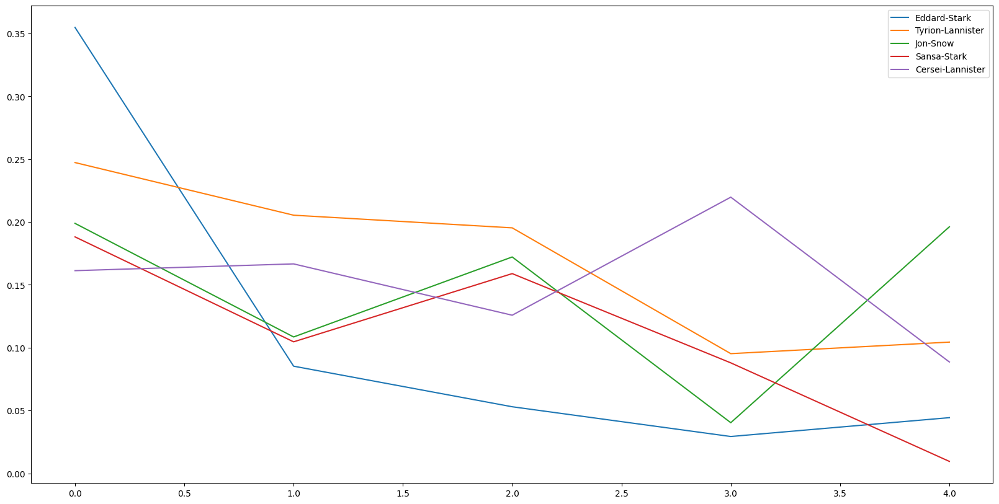

In [84]:
%matplotlib inline

# Creating a list of degree centrality of all the books
evol = [nx.degree_centrality(book) for book in allBooks]
 
# Creating a DataFrame from the list of degree centralities in all the books
degree_evol_df = pd.DataFrame.from_records(evol)

# Plotting the degree centrality evolution of Eddard-Stark, Tyrion-Lannister and Jon-Snow
degree_evol_df[['Eddard-Stark', 'Tyrion-Lannister', 'Jon-Snow','Sansa-Stark','Cersei-Lannister']].plot()

We can see that the importance of Eddard Stark dies off as the book series progresses. With Jon Snow, there is a drop in the fourth book but a sudden rise in the fifth book. Also, Stannis Baratheon who was not a part of top 10 in the first book is the second important character in book 5. If anything, the book series is totally unpredictable.

Now let's look at various other measures like Betweenness Centrality and PageRank to find important characters in our Game of Thrones character co-occurrence network and see if we can uncover some more interesting facts about this network.

Let's plot the evolution of betweenness centrality of this network over the five books. We will take the evolution of the top four characters of every book and plot it.

<AxesSubplot: >

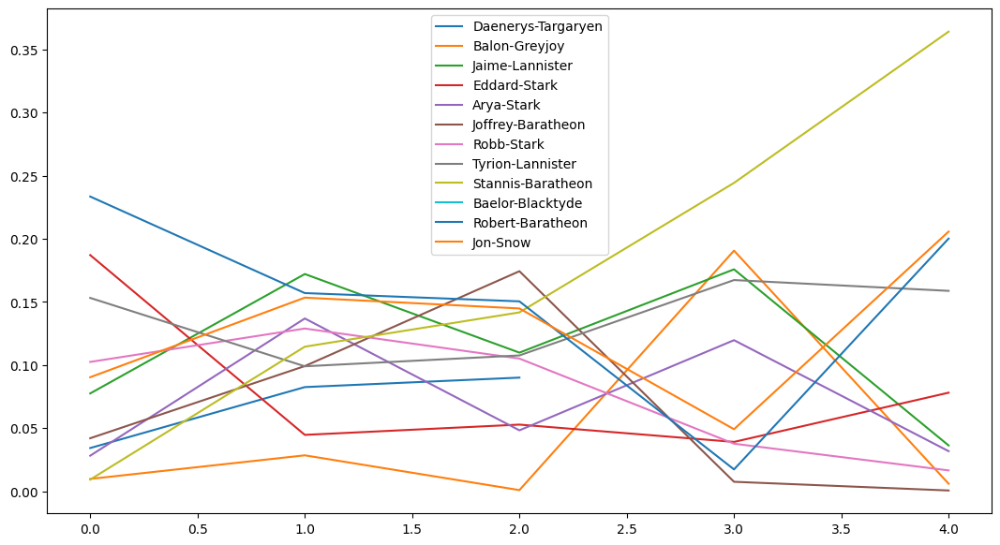

In [85]:
# Creating a list of betweenness centrality of all the books just like we did for degree centrality
evol = [nx.betweenness_centrality(book, weight='weight') for book in allBooks]

# Making a DataFrame from the list
betweenness_evol_df = pd.DataFrame.from_records(evol)

# Finding the top 4 characters in every book
set_of_char = set()
for i in range(5):
    set_of_char |= set(list(betweenness_evol_df.T[i].sort_values(ascending=False)[0:4].index))
list_of_char = list(set_of_char)

# Plotting the evolution of the top characters
betweenness_evol_df[list_of_char].plot(figsize=(13, 7))

['Daenerys-Targaryen',
 'Balon-Greyjoy',
 'Jaime-Lannister',
 'Eddard-Stark',
 'Arya-Stark',
 'Joffrey-Baratheon',
 'Robb-Stark',
 'Tyrion-Lannister',
 'Stannis-Baratheon',
 'Baelor-Blacktyde',
 'Robert-Baratheon',
 'Jon-Snow']

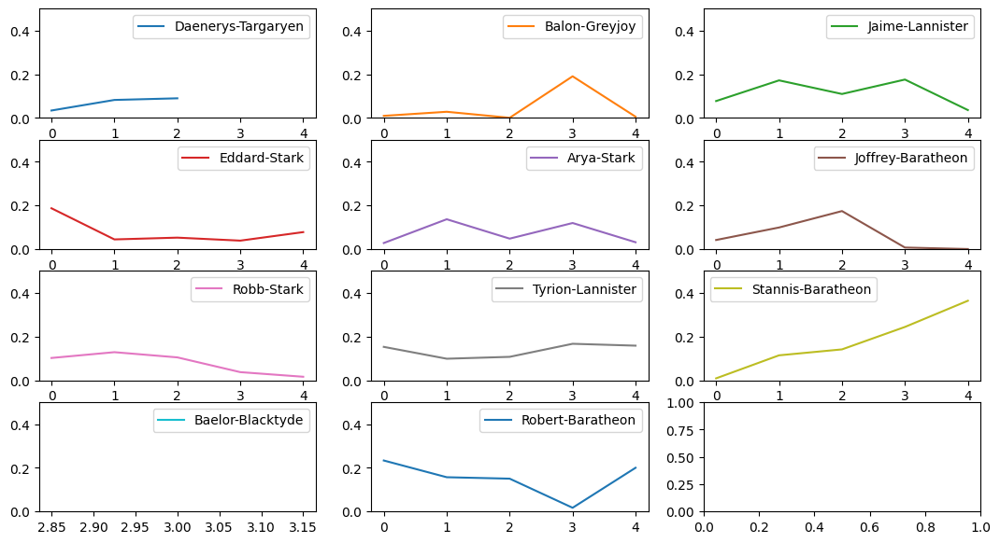

In [86]:
# Plot the evolution of the top characters in subplot
display(list_of_char)

my_colors = plt.rcParams['axes.prop_cycle']() #note that we CALL the prop_cycle
fig, axes = plt.subplots(nrows=4, ncols=3)    

for i in range(3):
    for j in range(3):
        betweenness_evol_df.plot(ax=axes[i, j], y=list_of_char[i*3+j], figsize=(13, 7), ylim=(0, 0.5),**next(my_colors))
for j in range(2):
    betweenness_evol_df.plot(ax=axes[3, j], y=list_of_char[9+j], figsize=(13, 7), ylim=(0, 0.5),**next(my_colors))

##### 3)What does Google PageRank tell us about GoT?

We see a peculiar rise in the importance of Stannis Baratheon over the books. In the fifth book, he is significantly more important than other characters in the network, even though he is the third most important character according to degree centrality.

PageRank was the initial way Google ranked web pages. It evaluates the inlinks and outlinks of webpages in the world wide web, which is, essentially, a directed network. Let's look at the importance of characters in the Game of Thrones network according to PageRank.

<AxesSubplot: >

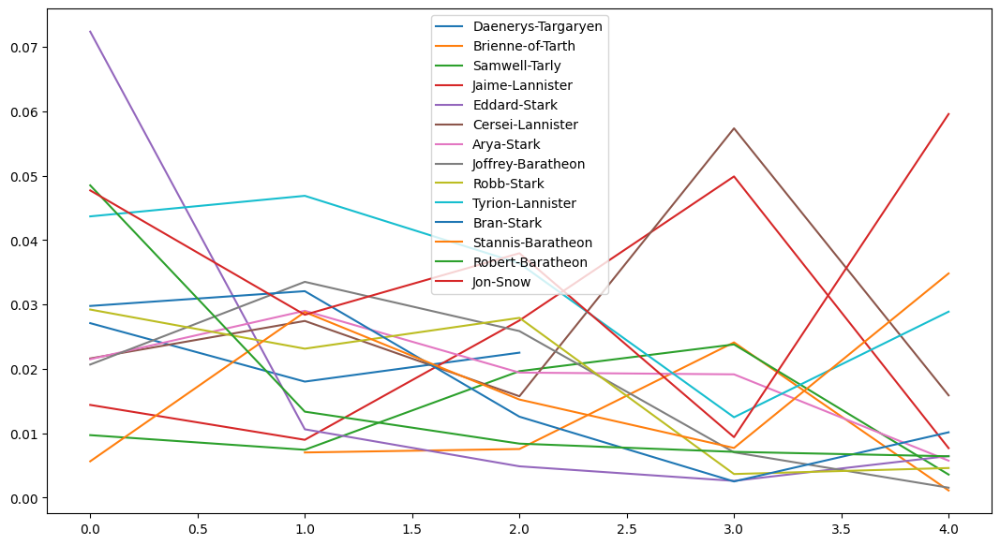

In [87]:
# Creating a list of pagerank of all the characters in all the books
evol = [nx.pagerank(book) for book in allBooks]

# Making a DataFrame from the list
pagerank_evol_df = pd.DataFrame.from_records(evol)

# Finding the top 4 characters in every book
set_of_char = set()
for i in range(5):
    set_of_char |= set(list(pagerank_evol_df.T[i].sort_values(ascending=False)[0:4].index))
list_of_char = list(set_of_char)

# Plotting the top characters
pagerank_evol_df[list_of_char].plot(figsize=(13, 7))

#### XI. Correlation between different measures

Stannis, Jon Snow, and Daenerys are the most important characters in the all the books according to PageRank. Eddard Stark follows a similar curve but for degree centrality and betweenness centrality: He is important in the first book but dies into oblivion over the book series.

We have seen three different measures to calculate the importance of a node in a network, and all of them tells us something about the characters and their importance in the co-occurrence network. We see some names pop up in all three measures so maybe there is a strong correlation between them?

Let's look at the correlation between PageRank, betweenness centrality and degree centrality for all the books using Pearson correlation.

In [88]:
# Creating a list of pagerank, betweenness centrality, degree centrality
# of all the characters in all books.
allMeasures = []
allCorr = []
print("Correlation between PageRank, betweenness centrality and degree centrality")
for i in range(5):
    measures = [nx.pagerank(allBooks[i]), 
                nx.betweenness_centrality(allBooks[i], weight='weight'), 
                nx.degree_centrality(allBooks[i])]
    allMeasures.append(measures)

    # Creating the correlation DataFrame
    cor = pd.DataFrame.from_records(measures)
    # Calculating the correlation
    cor.T.corr()
    allCorr.append(cor)
    
for i in range(5):
    print("CooreBook: {}".format(i + 1))
    print(allCorr[i].T.corr())
    print("\n")

Correlation between PageRank, betweenness centrality and degree centrality
CooreBook: 1
          0         1         2
0  1.000000  0.870210  0.949258
1  0.870210  1.000000  0.871385
2  0.949258  0.871385  1.000000


CooreBook: 2
          0         1         2
0  1.000000  0.796071  0.946047
1  0.796071  1.000000  0.824200
2  0.946047  0.824200  1.000000


CooreBook: 3
          0         1         2
0  1.000000  0.822604  0.955832
1  0.822604  1.000000  0.841844
2  0.955832  0.841844  1.000000


CooreBook: 4
          0         1         2
0  1.000000  0.656856  0.946802
1  0.656856  1.000000  0.720553
2  0.946802  0.720553  1.000000


CooreBook: 5
          0         1         2
0  1.000000  0.793372  0.971493
1  0.793372  1.000000  0.833816
2  0.971493  0.833816  1.000000




##### XII. Conclusion

We see a high correlation between these three measures for our character co-occurrence network.

So we've been looking at different ways to find the important characters in the Game of Thrones co-occurrence network. According to degree centrality, Eddard Stark is the most important character initially in the books. But who is/are the most important character(s) in the fifth book according to these three measures?

In [89]:
# Finding the most important character in all the books,  
# according to degree centrality, betweenness centrality and pagerank.
for i in range(5):
    print("Important charactesr in Book: {}".format(i + 1))
    p_rank, b_cent, d_cent = allCorr[i].idxmax(axis=1)
    # Printing out the top character accoding to the three measures
    print("Page Rank: ", p_rank, "\nBetweenness Centarlity: ", b_cent, "\nDegree Centrality: ", d_cent)
    print("\n")

Important charactesr in Book: 1
Page Rank:  Eddard-Stark 
Betweenness Centarlity:  Robert-Baratheon 
Degree Centrality:  Eddard-Stark


Important charactesr in Book: 2
Page Rank:  Tyrion-Lannister 
Betweenness Centarlity:  Jaime-Lannister 
Degree Centrality:  Tyrion-Lannister


Important charactesr in Book: 3
Page Rank:  Jon-Snow 
Betweenness Centarlity:  Joffrey-Baratheon 
Degree Centrality:  Tyrion-Lannister


Important charactesr in Book: 4
Page Rank:  Cersei-Lannister 
Betweenness Centarlity:  Stannis-Baratheon 
Degree Centrality:  Jaime-Lannister


Important charactesr in Book: 5
Page Rank:  Jon-Snow 
Betweenness Centarlity:  Stannis-Baratheon 
Degree Centrality:  Jon-Snow


